After mistakenly using the test set as validation set in the last two runs, I will run the same models again. This time, I have a completely new validation set created from new videos. I also added a few more training examples to address bounding box mistakes in the previous run. The last model had trouble detecting my hand correctly when it was close to my face. I added more samples that have my head in the frame, but my hand is further away from my face.

In [1]:
%load_ext autoreload
%autoreload 2
import project_utils_multi

import os
os.environ["CUDA_VISIBLE_DEVICES"]="1"
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3' 

import tensorflow as tf
# tf.get_logger().setLevel('INFO')
# tf.autograph.set_verbosity(1)
physical_devices = tf.config.list_physical_devices('GPU')
try:
    tf.config.experimental.set_memory_growth(physical_devices[0], True)
except:
    print('Invalid device. Error.')
    pass

from tensorflow import keras
from keras_preprocessing.image import ImageDataGenerator
from keras.callbacks import EarlyStopping

from random import randint
import numpy as np

RANDOM_SEED = 0
BATCH_SIZE = 32
IMAGE_SIZE = (224, 224)
EPOCHS = 100
LEARNING_RATE = 0.00005
ES_PATIENCE = 20
ES_RESTORE_WEIGHTS = True
PLAY_VIDEOS = True
PLAY_DATA_VIDEOS = False

In [2]:
df_train = project_utils_multi.load_image_dataframes('./data/train/', 'annotations.json')
display(df_train)
df_train['y1'] = df_train['y1'] / project_utils_multi.ORIGINAL_IMAGE_HEIGHT
df_train['x1'] = df_train['x1'] / project_utils_multi.ORIGINAL_IMAGE_WIDTH
df_train['y2'] = df_train['y2'] / project_utils_multi.ORIGINAL_IMAGE_HEIGHT
df_train['x2'] = df_train['x2'] / project_utils_multi.ORIGINAL_IMAGE_WIDTH
display(df_train)

,id,confidence,y1,x1,y2,x2
0,00001.jpg,1.0,152.0,140.0,397.0,346.0
1,00002.jpg,1.0,144.0,140.0,403.0,345.0
2,00003.jpg,1.0,142.0,138.0,402.0,346.0
3,00004.jpg,1.0,144.0,140.0,405.0,344.0
4,00005.jpg,1.0,141.0,140.0,407.0,344.0
...,...,...,...,...,...,...
46603,46604.jpg,0.0,0.0,0.0,0.0,0.0
46604,46605.jpg,0.0,0.0,0.0,0.0,0.0
46605,46606.jpg,0.0,0.0,0.0,0.0,0.0
46606,46607.jpg,0.0,0.0,0.0,0.0,0.0


,id,confidence,y1,x1,y2,x2
0,00001.jpg,1.0,0.211111,0.145833,0.551389,0.360417
1,00002.jpg,1.0,0.200000,0.145833,0.559722,0.359375
2,00003.jpg,1.0,0.197222,0.143750,0.558333,0.360417
3,00004.jpg,1.0,0.200000,0.145833,0.562500,0.358333
4,00005.jpg,1.0,0.195833,0.145833,0.565278,0.358333
...,...,...,...,...,...,...
46603,46604.jpg,0.0,0.000000,0.000000,0.000000,0.000000
46604,46605.jpg,0.0,0.000000,0.000000,0.000000,0.000000
46605,46606.jpg,0.0,0.000000,0.000000,0.000000,0.000000
46606,46607.jpg,0.0,0.000000,0.000000,0.000000,0.000000


In [3]:
df_validation = project_utils_multi.load_image_dataframes('./data/validation/', 'annotations.json')
display(df_validation)
df_validation['y1'] = df_validation['y1'] / project_utils_multi.ORIGINAL_IMAGE_HEIGHT
df_validation['x1'] = df_validation['x1'] / project_utils_multi.ORIGINAL_IMAGE_WIDTH
df_validation['y2'] = df_validation['y2'] / project_utils_multi.ORIGINAL_IMAGE_HEIGHT
df_validation['x2'] = df_validation['x2'] / project_utils_multi.ORIGINAL_IMAGE_WIDTH
display(df_validation)

,id,confidence,y1,x1,y2,x2
0,00001.jpg,1.0,237.0,300.0,494.0,514.0
1,00002.jpg,1.0,255.0,345.0,508.0,517.0
2,00003.jpg,1.0,254.0,355.0,514.0,526.0
3,00004.jpg,1.0,258.0,384.0,527.0,540.0
4,00005.jpg,1.0,275.0,399.0,510.0,547.0
...,...,...,...,...,...,...
443,00444.jpg,0.0,0.0,0.0,0.0,0.0
444,00445.jpg,0.0,0.0,0.0,0.0,0.0
445,00446.jpg,0.0,0.0,0.0,0.0,0.0
446,00447.jpg,0.0,0.0,0.0,0.0,0.0


,id,confidence,y1,x1,y2,x2
0,00001.jpg,1.0,0.329167,0.312500,0.686111,0.535417
1,00002.jpg,1.0,0.354167,0.359375,0.705556,0.538542
2,00003.jpg,1.0,0.352778,0.369792,0.713889,0.547917
3,00004.jpg,1.0,0.358333,0.400000,0.731944,0.562500
4,00005.jpg,1.0,0.381944,0.415625,0.708333,0.569792
...,...,...,...,...,...,...
443,00444.jpg,0.0,0.000000,0.000000,0.000000,0.000000
444,00445.jpg,0.0,0.000000,0.000000,0.000000,0.000000
445,00446.jpg,0.0,0.000000,0.000000,0.000000,0.000000
446,00447.jpg,0.0,0.000000,0.000000,0.000000,0.000000


In [4]:
df_test = project_utils_multi.load_image_dataframes('./data/test/', 'annotations.json')
display(df_test)
df_test['y1'] = df_test['y1'] / project_utils_multi.ORIGINAL_IMAGE_HEIGHT
df_test['x1'] = df_test['x1'] / project_utils_multi.ORIGINAL_IMAGE_WIDTH
df_test['y2'] = df_test['y2'] / project_utils_multi.ORIGINAL_IMAGE_HEIGHT
df_test['x2'] = df_test['x2'] / project_utils_multi.ORIGINAL_IMAGE_WIDTH
display(df_test)

,id,confidence,y1,x1,y2,x2
0,00001.jpg,1.0,439.0,600.0,630.0,804.0
1,00002.jpg,1.0,280.0,466.0,467.0,650.0
2,00003.jpg,1.0,204.0,455.0,409.0,636.0
3,00004.jpg,1.0,218.0,380.0,412.0,538.0
4,00005.jpg,1.0,220.0,405.0,423.0,568.0
...,...,...,...,...,...,...
305,00306.jpg,0.0,0.0,0.0,0.0,0.0
306,00307.jpg,0.0,0.0,0.0,0.0,0.0
307,00308.jpg,0.0,0.0,0.0,0.0,0.0
308,00309.jpg,0.0,0.0,0.0,0.0,0.0


,id,confidence,y1,x1,y2,x2
0,00001.jpg,1.0,0.609722,0.625000,0.875000,0.837500
1,00002.jpg,1.0,0.388889,0.485417,0.648611,0.677083
2,00003.jpg,1.0,0.283333,0.473958,0.568056,0.662500
3,00004.jpg,1.0,0.302778,0.395833,0.572222,0.560417
4,00005.jpg,1.0,0.305556,0.421875,0.587500,0.591667
...,...,...,...,...,...,...
305,00306.jpg,0.0,0.000000,0.000000,0.000000,0.000000
306,00307.jpg,0.0,0.000000,0.000000,0.000000,0.000000
307,00308.jpg,0.0,0.000000,0.000000,0.000000,0.000000
308,00309.jpg,0.0,0.000000,0.000000,0.000000,0.000000


In [5]:
train_datagen= project_utils_multi.create_data_generators(df_train, ['confidence', 'y1', 'x1', 'y2', 'x2'], directory='./data/train/', seed=RANDOM_SEED)
validation_datagen = project_utils_multi.create_data_generators(df_validation, ['confidence', 'y1', 'x1', 'y2', 'x2'], directory='./data/validation/', seed=RANDOM_SEED)
test_datagen = project_utils_multi.create_data_generators(df_test, ['confidence', 'y1', 'x1', 'y2', 'x2'], directory='./data/test/', seed=RANDOM_SEED)
if PLAY_DATA_VIDEOS:
    display(project_utils_multi.play_images_from_sequence_datagen(train_datagen, num_to_iter=250))
    display(project_utils_multi.play_images_from_sequence_datagen(validation_datagen, num_to_iter=1))
    display(project_utils_multi.play_images_from_sequence_datagen(test_datagen, num_to_iter=1))

In [6]:
pos_neg = project_utils_multi.get_negative_positive_count('./data/train/', 'annotations.json')
print('Total Examples: ', pos_neg['positive'] + pos_neg['negative'])
print('Total positive: ', pos_neg['positive'])
print('Total negative: ', pos_neg['negative'])
print('Train positive: ', train_datagen.get_positive_count())
print('Train negative: ', train_datagen.get_negative_count())
print('Validation positive: ', validation_datagen.get_positive_count())
print('Validation negative: ', validation_datagen.get_negative_count())
print('Test positive: ', test_datagen.get_positive_count())
print('Test negative: ', test_datagen.get_negative_count())

Total Examples:  46608
Total positive:  35960
Total negative:  10648
Train positive:  35960
Train negative:  10648
Validation positive:  364
Validation negative:  84
Test positive:  262
Test negative:  48


In [12]:
vgg = keras.applications.VGG19(weights='imagenet', include_top=False, input_tensor=keras.layers.Input(shape=(224, 224, 3)))
vgg.trainable = False
flatten = vgg.output
flatten = keras.layers.Flatten()(flatten)


hidden = keras.layers.Dense(1024, activation='relu')(flatten)
hidden = keras.layers.Dropout(0.1)(hidden)
hidden = keras.layers.Dense(512, activation='relu')(hidden)
hidden = keras.layers.Dropout(0.1)(hidden)
hidden = keras.layers.Dense(256, activation='relu')(hidden)
hidden = keras.layers.Dropout(0.1)(hidden)


confHead = keras.layers.Dense(1, activation='sigmoid', name='confidence_output')(hidden)
bbHead = keras.layers.Dense(4, activation='sigmoid', name='bounding_output')(hidden)

model = keras.models.Model(inputs=vgg.input, outputs=[confHead, bbHead])

opt = keras.optimizers.Adam(learning_rate=LEARNING_RATE)

model.compile(loss='mse', optimizer=opt, metrics=[[keras.metrics.BinaryAccuracy(), keras.metrics.AUC()], [project_utils_multi.IOU_Metric()]])#, run_eagerly=True)


es = EarlyStopping(monitor='val_bounding_output_iou__metric', mode='max', verbose=1, patience=ES_PATIENCE, restore_best_weights=ES_RESTORE_WEIGHTS)

history = model.fit(train_datagen, 
                    steps_per_epoch=train_datagen.get_length() // BATCH_SIZE,
                    validation_data=validation_datagen, 
                    validation_steps = validation_datagen.get_length() // BATCH_SIZE,
                    epochs=EPOCHS, 
                    callbacks=[es])

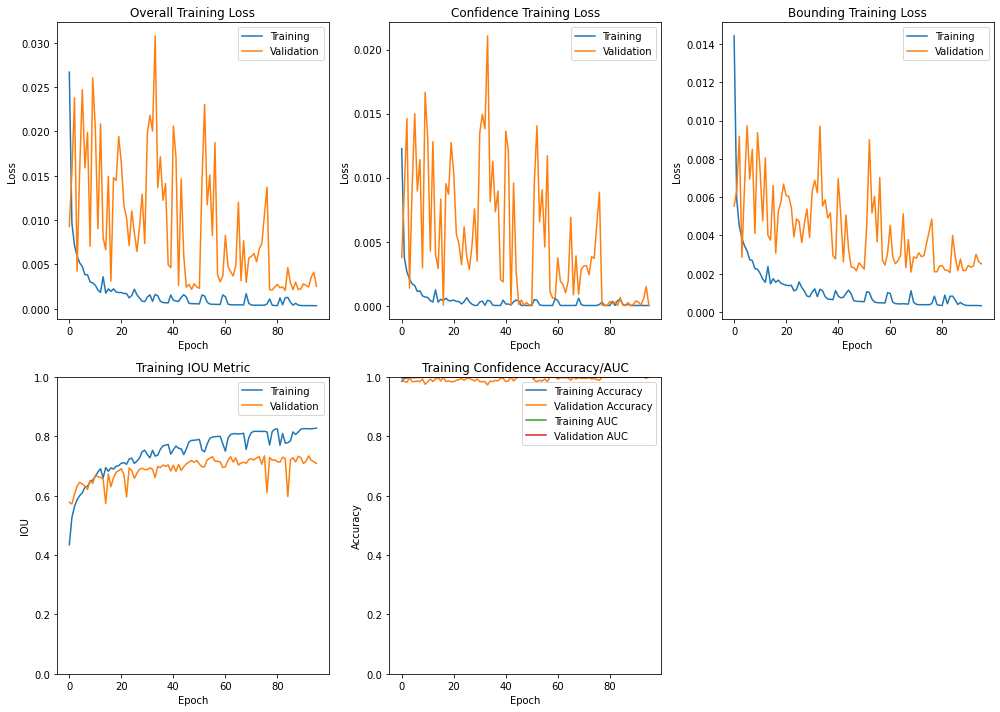

9/9 [==============================] - 2s 181ms/step - loss: 0.0045 - confidence_output_loss: 0.0025 - bounding_output_loss: 0.0020 - confidence_output_binary_accuracy: 0.9965 - confidence_output_auc: 1.0000 - bounding_output_iou__metric: 0.6697
Training Loss: 0.0001965621777344495
Training IOU: 0.8719436526298523
Validation Loss: 0.010593569837510586
Validation IOU: 0.7345456480979919
Test Loss: 0.0045265802182257175
Test IOU: 0.6696897745132446


In [8]:
project_utils_multi.plot_history(history)
train_results = model.evaluate(train_datagen)
validation_results = model.evaluate(validation_datagen)
test_results = model.evaluate(test_datagen)
print('Training Loss: {}\nTraining IOU: {}'.format(train_results[0], train_results[-1]))
print('Validation Loss: {}\nValidation IOU: {}'.format(validation_results[0], validation_results[-1]))
print('Test Loss: {}\nTest IOU: {}'.format(test_results[0], test_results[-1]))
project_utils_multi.write_results('./history.txt', model, history, train_datagen, validation_datagen, train_results, validation_results, test_results)

In [9]:
project_utils_multi.append_score_data('./scores.txt', model, train_datagen, history, es, train_results, validation_results, test_results)

In [10]:
model.save('./saves/last_model.h5')

In [11]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_sequence_datagen(train_datagen, model=model, num_to_iter=100, scaled_targets=True))

In [12]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_sequence_datagen(validation_datagen, model=model, num_to_iter=1, scaled_targets=True))

In [13]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_sequence_datagen(test_datagen, model=model, num_to_iter=1, scaled_targets=True))

In [14]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_video('../../data/original/videos/hand_signs_hand_only.mp4', model=model, scaled_targets=True))

In [15]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_video('../../data/original/videos/hand_signs_webcam.mp4', model=model, scaled_targets=True))

In [18]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_video('../../data/original/videos/video_1.mp4', model=model, scaled_targets=True))

In [19]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_video('../../data/original/videos/video_2.mp4', model=model, scaled_targets=True))

In [20]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_video('../../data/original/videos/video_3.mp4', model=model, scaled_targets=True))

In [21]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_video('../../data/original/videos/video_4.mp4', model=model, scaled_targets=True))

In [22]:
if PLAY_VIDEOS:
    display(project_utils_multi.play_images_from_video('../../data/original/videos/video_5.mp4', model=model, scaled_targets=True))

Epoch 1/10
1456/1456 [==============================] - 280s 192ms/step - loss: 2.9720e-04 - confidence_output_loss: 3.8710e-06 - bounding_output_loss: 2.9333e-04 - confidence_output_binary_accuracy: 1.0000 - confidence_output_auc_2: 1.0000 - bounding_output_iou__metric_2: 0.8359 - val_loss: 0.0082 - val_confidence_output_loss: 0.0053 - val_bounding_output_loss: 0.0029 - val_confidence_output_binary_accuracy: 0.9911 - val_confidence_output_auc_2: 0.9999 - val_bounding_output_iou__metric_2: 0.7337
Epoch 2/10
1456/1456 [==============================] - 279s 191ms/step - loss: 3.8617e-04 - confidence_output_loss: 8.0413e-05 - bounding_output_loss: 3.0576e-04 - confidence_output_binary_accuracy: 0.9999 - confidence_output_auc_2: 0.9999 - bounding_output_iou__metric_2: 0.8356 - val_loss: 0.0082 - val_confidence_output_loss: 0.0053 - val_bounding_output_loss: 0.0029 - val_confidence_output_binary_accuracy: 0.9911 - val_confidence_output_auc_2: 0.9999 - val_bounding_output_iou__metric_2: 0.7

KeyError: 'bounding_output_iou__metric'

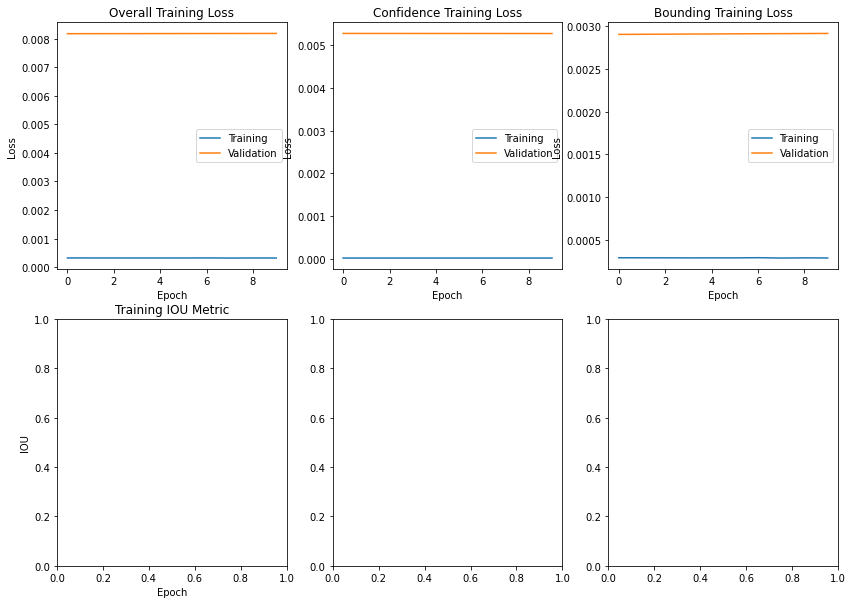

In [26]:
# opt = keras.optimizers.Adam(learning_rate=0.00001)
opt = keras.optimizers.SGD(learning_rate=0.00001)
model.compile(loss='mse', optimizer=opt, metrics=[[keras.metrics.BinaryAccuracy(), keras.metrics.AUC()], [project_utils_multi.IOU_Metric()]])

history2 = model.fit(train_datagen, 
                     steps_per_epoch=train_datagen.get_length() // BATCH_SIZE,
                     validation_data=validation_datagen, 
                     validation_steps = validation_datagen.get_length() // BATCH_SIZE,
                     epochs=10, 
                     callbacks=[])

project_utils_multi.plot_history(history2)
train_results2 = model.evaluate(train_datagen)
validation_results2 = model.evaluate(validation_datagen)
test_results2 = model.evaluate(test_datagen)
print('Training Loss: {}\nTraining IOU: {}'.format(train_results2[0], train_results2[-1]))
print('Validation Loss: {}\nValidation IOU: {}'.format(validation_results2[0], validation_results2[-1]))
print('Test Loss: {}\nTest IOU: {}'.format(test_results2[0], test_results2[-1]))

In [25]:
print(history2.history)

{'loss': [0.000349957263097167, 0.00034322228748351336, 0.0003345379955135286, 0.0003321491240058094, 0.00032956089125946164, 0.00032850599382072687, 0.00032414047745987773, 0.0003211030852980912, 0.0003199211205355823, 0.00031930170371197164], 'confidence_output_loss': [2.1745758203906007e-05, 2.1722324163420126e-05, 2.1672927687177435e-05, 2.167706952604931e-05, 2.1662366634700447e-05, 2.1622432541335e-05, 2.1615487639792264e-05, 2.1603511413559318e-05, 2.1604455469059758e-05, 2.1597277736873366e-05], 'bounding_output_loss': [0.0003282114630565047, 0.0003215002943761647, 0.00031286521698348224, 0.0003104723000433296, 0.00030789864831604064, 0.0003068834776058793, 0.00030252497526817024, 0.00029949963209219277, 0.00029831670690327883, 0.0002977041294798255], 'confidence_output_binary_accuracy': [0.9999785423278809, 0.9999785423278809, 0.9999785423278809, 0.9999785423278809, 0.9999785423278809, 0.9999785423278809, 0.9999785423278809, 0.9999785423278809, 0.9999785423278809, 0.9999785423